In [54]:
%matplotlib inline
import numpy as np
from matplotlib import pyplot as plt
import torch
from glob import glob
import pandas as pd
from torchvision import datasets, transforms
import importlib
from ps3_functions import *
import torchvision
from matplotlib import cm
import scprep
import seaborn as sns

In [4]:
data = pd.read_pickle("../data/retinal-bipolar-data.pickle")
metadata = pd.read_pickle("../data/retinal-bipolar-metadata.pickle")
pca_data = scprep.reduce.pca(data)
print("PCA complete")


PCA complete


In [41]:
class retinal_Bipolar_Autoencoder(nn.Module):
    def __init__(self):
        super(retinal_Bipolar_Autoencoder, self).__init__()
        self.lin1 = nn.Linear(100, 1000)
        # define additional layers here
        # 784-1000-500-250-2-250-500-1000-784
        self.lin2 = nn.Linear(1000, 500)
        self.lin3 = nn.Linear(500, 250)
        self.lin4 = nn.Linear(250, 2)
        self.lin5 = nn.Linear(2, 250)
        self.lin6 = nn.Linear(250, 500)
        self.lin7 = nn.Linear(500, 1000)
        self.lin8 = nn.Linear(1000, 100)

    def encode(self, x):
        x = self.lin1(x)
        # ... additional layers, plus possible nonlinearities.
        for layer in [self.lin2,
                      self.lin3,
                      self.lin4,
                      ]:
            x = torch.tanh(x)
            x = layer(x)
        return x

    def decode(self, z):
        # ditto, but in reverse
        z = self.lin5(z)
        z = torch.tanh(z)
        z = self.lin6(z)
        z = torch.tanh(z)
        z = self.lin7(z)
        # z = torch.sigmoid(z)
        z = self.lin8(z)
        return z

    def forward(self, x):
        z = self.encode(x)
        return self.decode(z)

In [10]:
21552*0.8

17241.600000000002

In [9]:
len(pca_data)

21552

In [11]:
train_pca_data = pca_data[:17200]
test_pca_data = pca_data[17200:]

In [13]:
train_metadata = metadata[:17200]
test_metadata = metadata[17200:]

In [15]:
train_pca_subsample, train_labels_subsample = scprep.select.subsample(train_pca_data, train_metadata, n=8000)
test_pca_subsample, test_labels_subsample = scprep.select.subsample(test_pca_data, test_metadata, n=2000)

In [17]:
type(train_pca_subsample)

pandas.core.frame.DataFrame

In [20]:
test_labels_subsample['CELLTYPE'].values

array(['BC5D', 'BC5C', 'BC5C', ..., '-1', '-1', '-1'], dtype=object)

In [71]:
model = retinal_Bipolar_Autoencoder()
optimizer = torch.optim.Adam(model.parameters(), lr=1e-3)
loss_fn = nn.MSELoss()
batch_size = 128
np.random.seed(12051991)
train_indices = np.random.choice(range(17200), size=17200, replace=False)

In [60]:
for ii in range(int(17200/batch_size)):
    data = train_pca_data.take(train_indices[batch_size*ii: batch_size*(ii+1)])
    labels = train_metadata.take(train_indices[batch_size*ii: batch_size*(ii+1)])\
    model_input = torch.tensor(data.values).float()

    out = model(model_input)

    # Calculate the loss
    image_targets = model_input
    #print("image_targets.shape", image_targets.shape)
    loss = loss_fn(out, image_targets)

    # Find the gradients of our loss via backpropogation
    loss.backward()

    # Adjust accordingly with the optimizer
    optimizer.step()
    optimizer.zero_grad()


(128, 100)
(128, 100)
(128, 100)
(128, 100)
(128, 100)
(128, 100)
(128, 100)
(128, 100)
(128, 100)
(128, 100)
(128, 100)
(128, 100)
(128, 100)
(128, 100)
(128, 100)
(128, 100)
(128, 100)
(128, 100)
(128, 100)
(128, 100)
(128, 100)
(128, 100)
(128, 100)
(128, 100)
(128, 100)
(128, 100)
(128, 100)
(128, 100)
(128, 100)
(128, 100)
(128, 100)
(128, 100)
(128, 100)
(128, 100)
(128, 100)
(128, 100)
(128, 100)
(128, 100)
(128, 100)
(128, 100)
(128, 100)
(128, 100)
(128, 100)
(128, 100)
(128, 100)
(128, 100)
(128, 100)
(128, 100)
(128, 100)
(128, 100)
(128, 100)
(128, 100)
(128, 100)
(128, 100)
(128, 100)
(128, 100)
(128, 100)
(128, 100)
(128, 100)
(128, 100)
(128, 100)
(128, 100)
(128, 100)
(128, 100)
(128, 100)
(128, 100)
(128, 100)
(128, 100)
(128, 100)
(128, 100)
(128, 100)
(128, 100)
(128, 100)
(128, 100)
(128, 100)
(128, 100)
(128, 100)
(128, 100)
(128, 100)
(128, 100)
(128, 100)
(128, 100)
(128, 100)
(128, 100)
(128, 100)
(128, 100)
(128, 100)
(128, 100)
(128, 100)
(128, 100)
(128, 100)

In [32]:
data.values

array([[0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ],
       [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ],
       [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ],
       ...,
       [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ],
       [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ],
       [0.        , 4.03896196, 0.        , ..., 0.        , 0.        ,
        0.        ]])

,0610005C13Rik,0610007P14Rik,0610009B22Rik,0610009E02Rik,0610009L18Rik,0610009O20Rik,0610010F05Rik,0610010K14Rik,0610011F06Rik,0610030E20Rik,...,mt-Tl1,mt-Tl2,mt-Tm,mt-Tp,mt-Tq,mt-Ts2,mt-Tt,mt-Tv,mt-Tw,mt-Ty
Bipolar1_CTCCTAAACAAG,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,...,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0
Bipolar1_CTCGAGAGGCGC,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,...,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0
Bipolar1_AGCCTAAAGTAC,0.0,0.000000,0.0,0.0,0.0,0.0,2.671658,0.0,0.0,0.0,...,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0
Bipolar1_CGTGAAAATCAA,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,...,0.0,0.0,0.0,2.670705,0.0,0.0,0.0,0.0,0.0,0.0
Bipolar1_CAACGTTCCGTA,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,...,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Bipolar6_GCGAACCTCTAT,0.0,0.000000,0.0,0.0,0.0,0.0,5.665927,0.0,0.0,0.0,...,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0
Bipolar6_GTAATCGGAACC,0.0,4.038962,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,...,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0
Bipolar6_GAGCCCGCGTGT,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,...,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0
Bipolar6_GATCCTTGCTTA,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,...,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0


In [56]:
labels

,CLUSTER,SUB-CLUSTER,CELLTYPE
Bipolar4_AGGTCCTTCGAT,-1.0,-1,-1
Bipolar2_GACGTGCGACAA,1.0,1,Rod BC
Bipolar4_GGACCTAATTCC,-1.0,-1,-1
Bipolar4_AGAAATGACATC,1.0,1,Rod BC
Bipolar5_TTGGGATACTGT,7.0,7,BC1A
...,...,...,...
Bipolar2_AGGAGGATCGCT,1.0,1,Rod BC
Bipolar1_GAGTTTAAGAGC,7.0,7,BC1A
Bipolar2_CAGGATAAGCCT,1.0,1,Rod BC
Bipolar3_GAGTATCGATCT,2.0,2,Muller Glia


(17200, 100)


<AxesSubplot:xlabel='Autoencoder latent1', ylabel='Autoencoder latent2'>

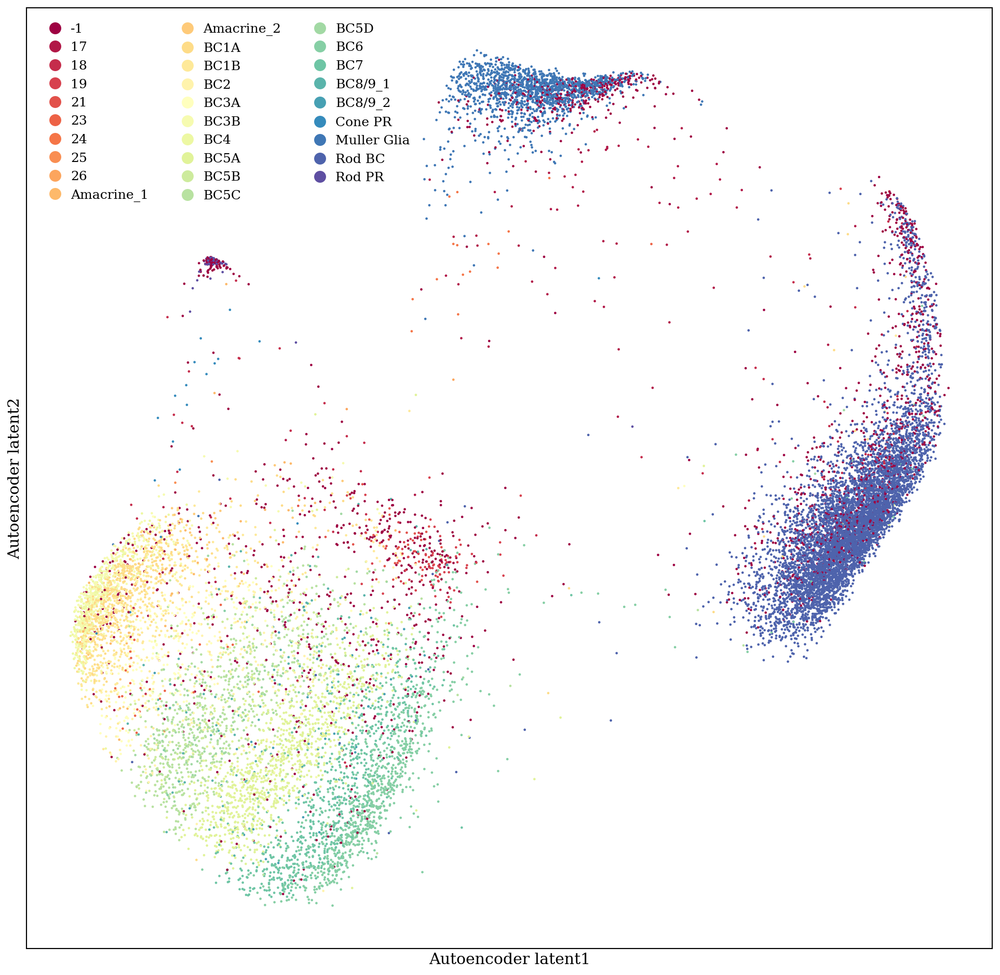

In [64]:
data = train_pca_data.take(train_indices[:])
labels = train_metadata.take(train_indices[:])
model_input = torch.tensor(data.values).float()

fig, axes = plt.subplots(figsize=(16,16), dpi=150)
e = model.encode(model_input)
e = e.detach().numpy()
labels=metadata.take(train_indices[:])
#axes.scatter(e[:,0], e[:,1], c=labels)
scprep.plot.scatter2d(e, c=labels['CELLTYPE'], ax=axes, cmap="Spectral",
                      ticks=False,label_prefix="Autoencoder latent")

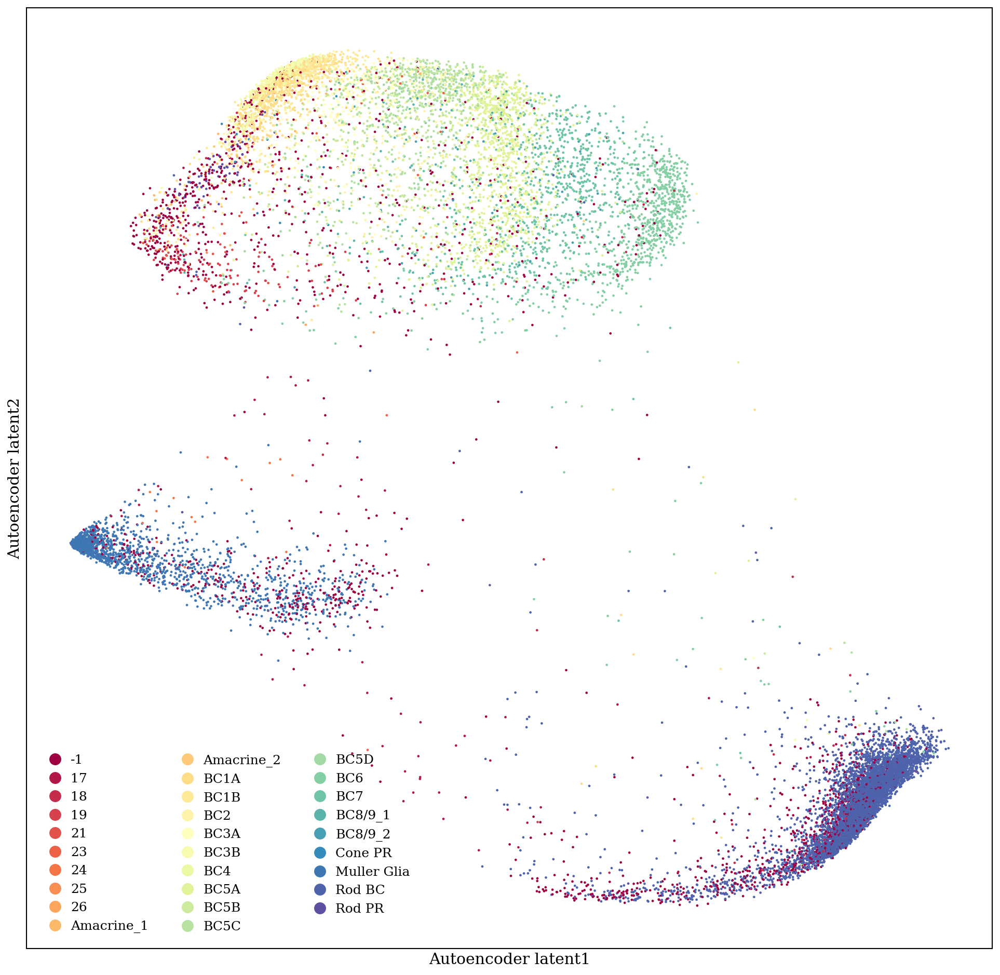

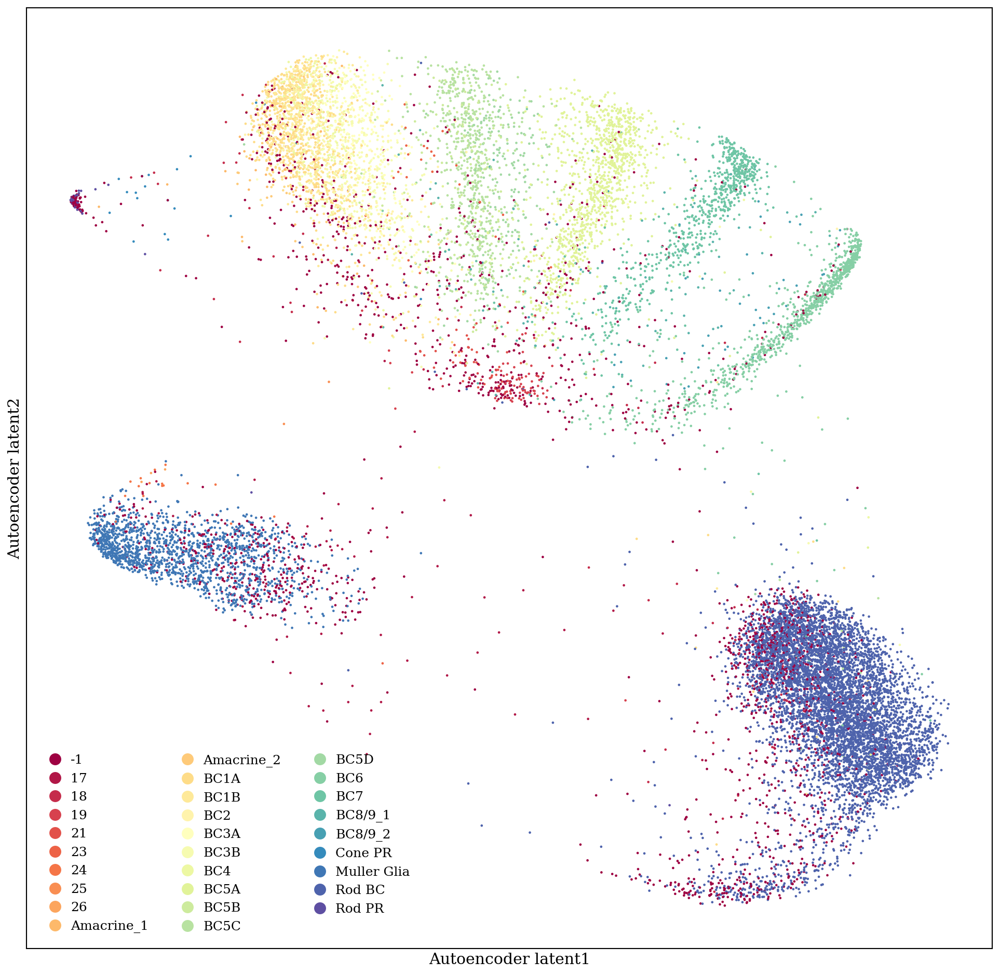

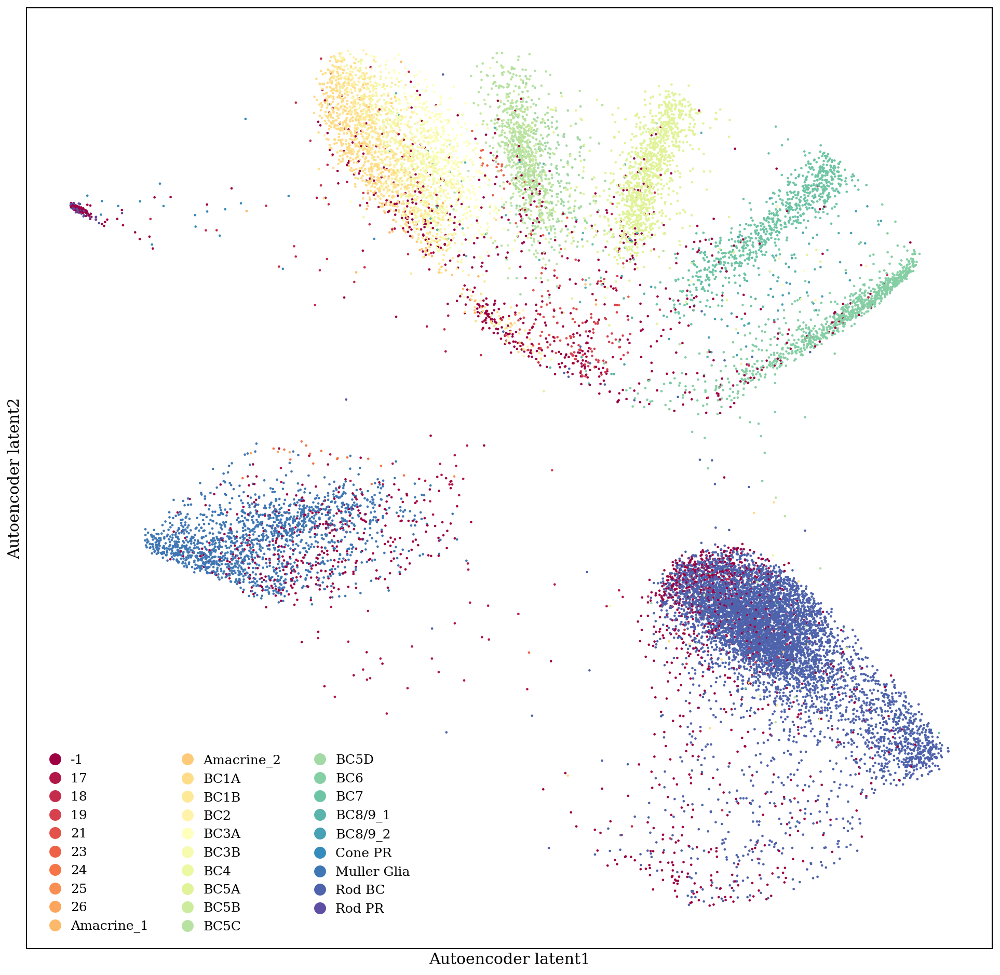

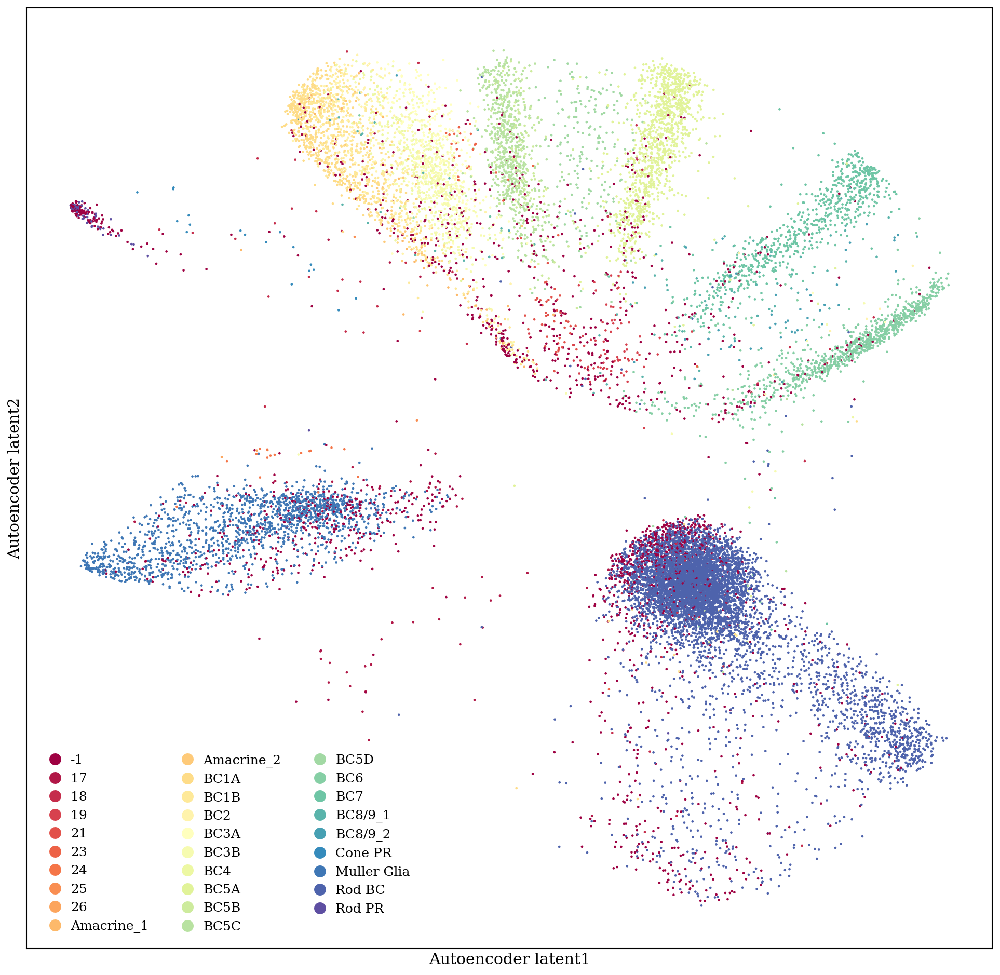

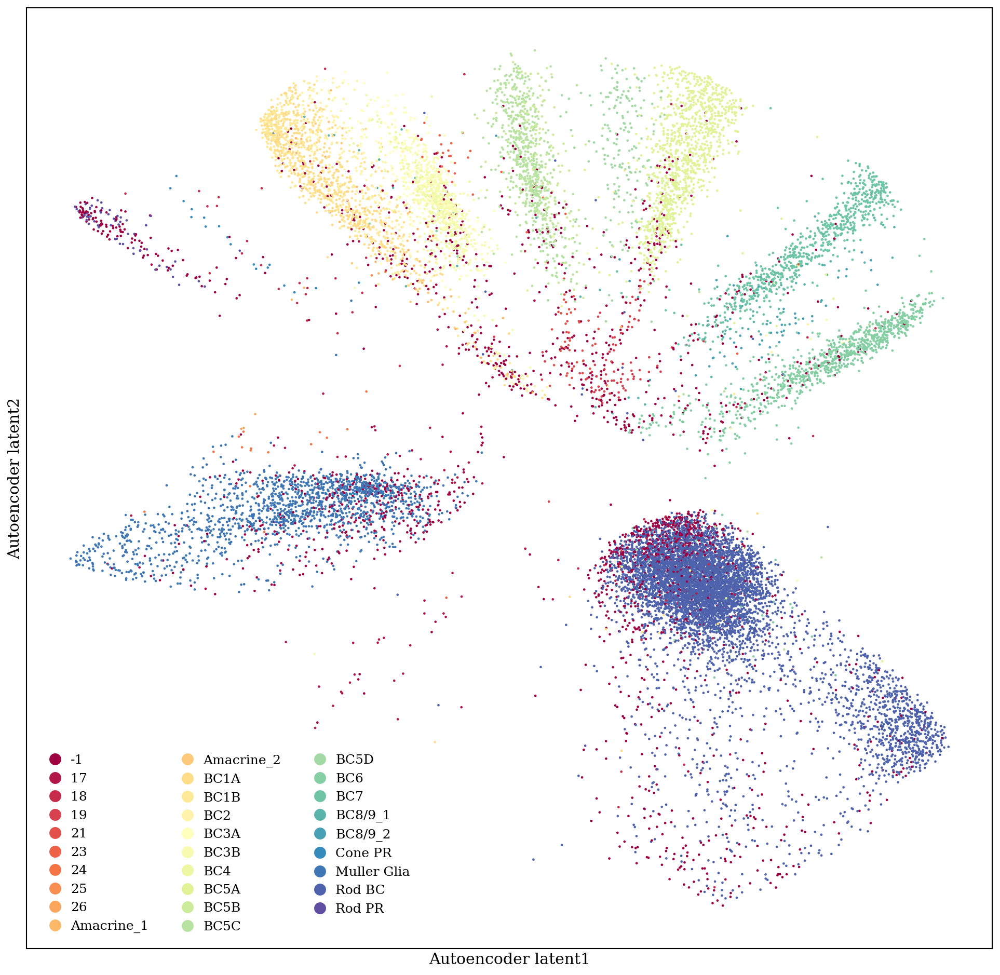

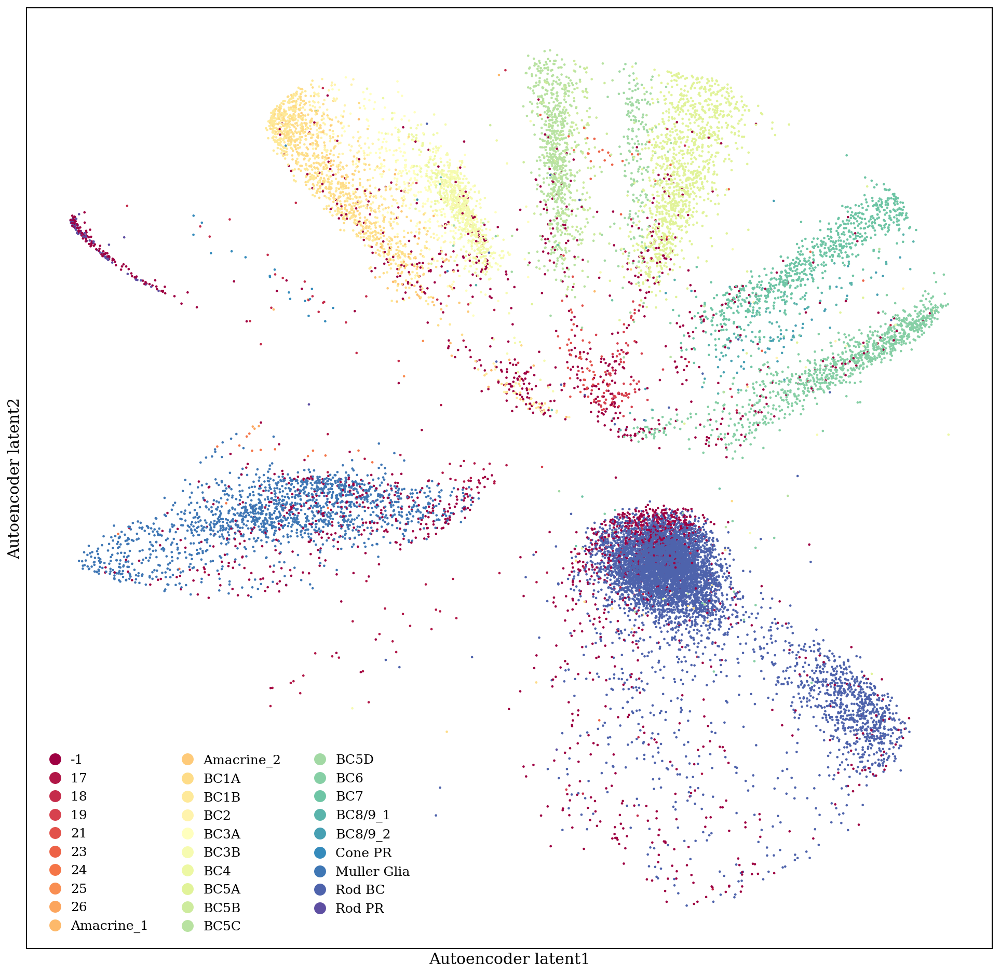

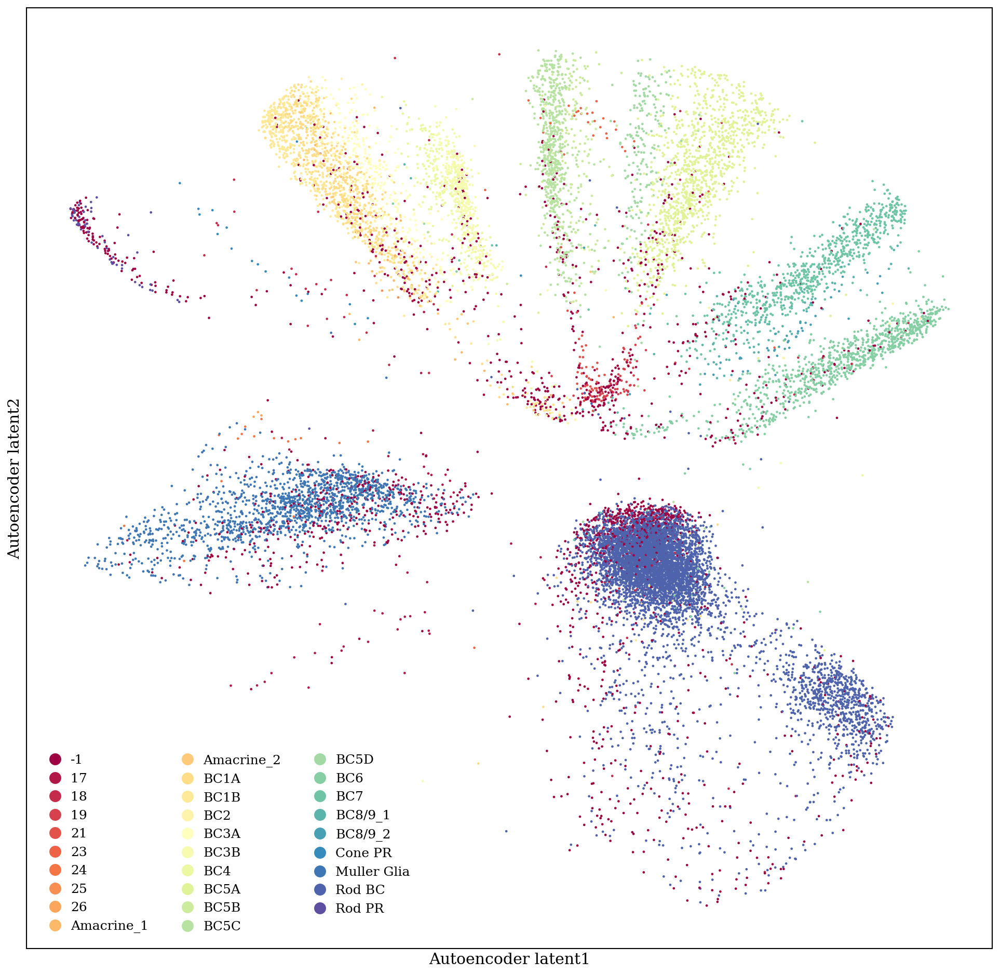

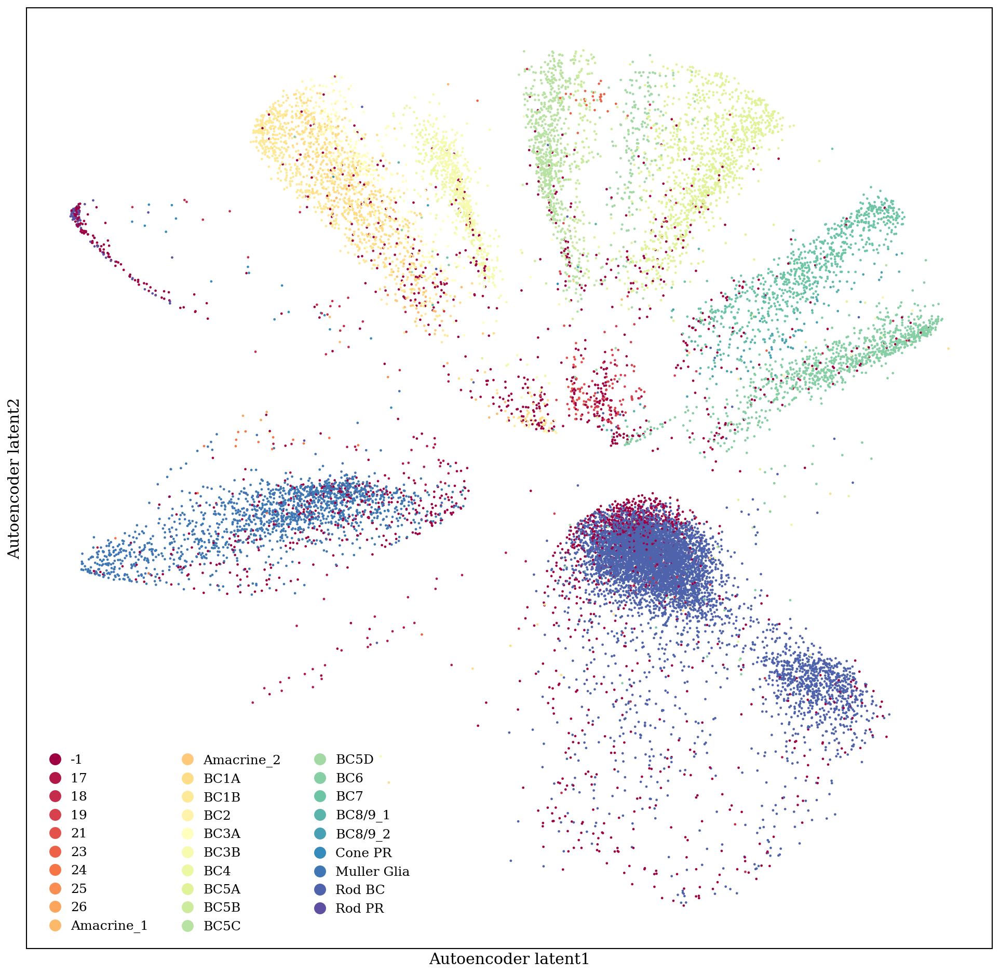

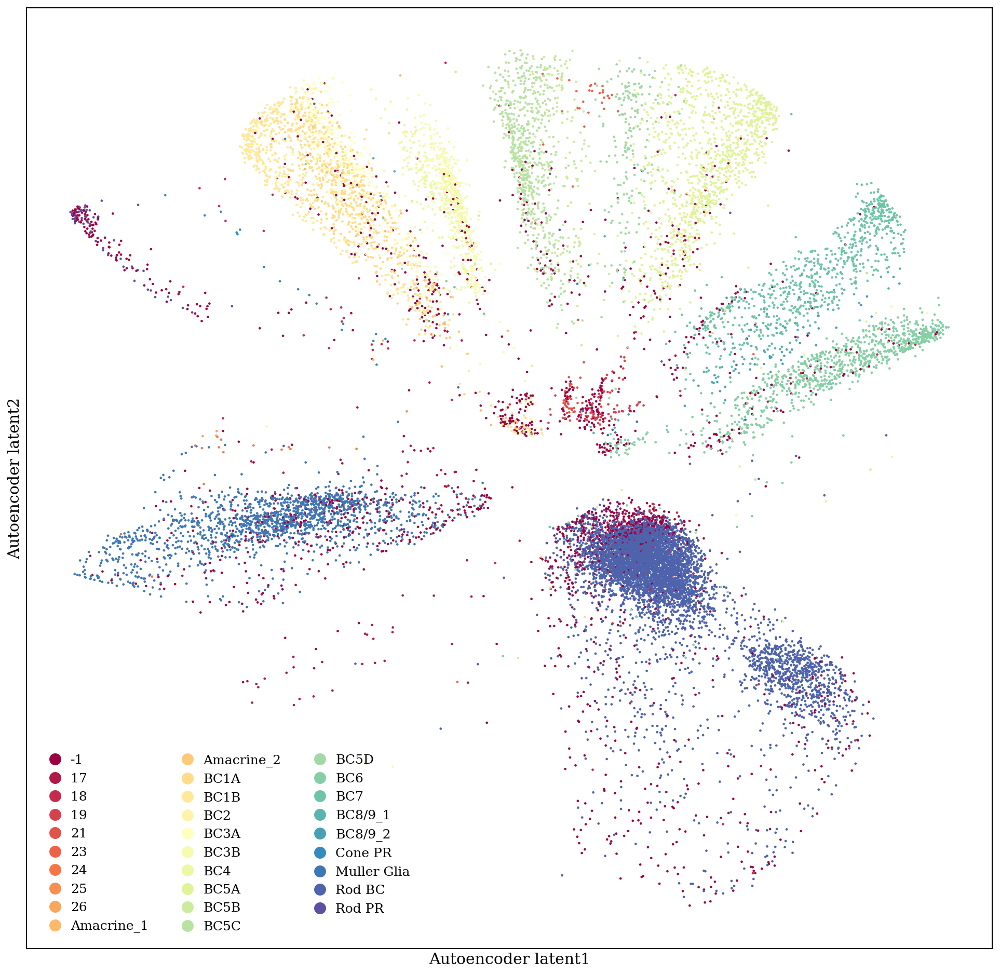

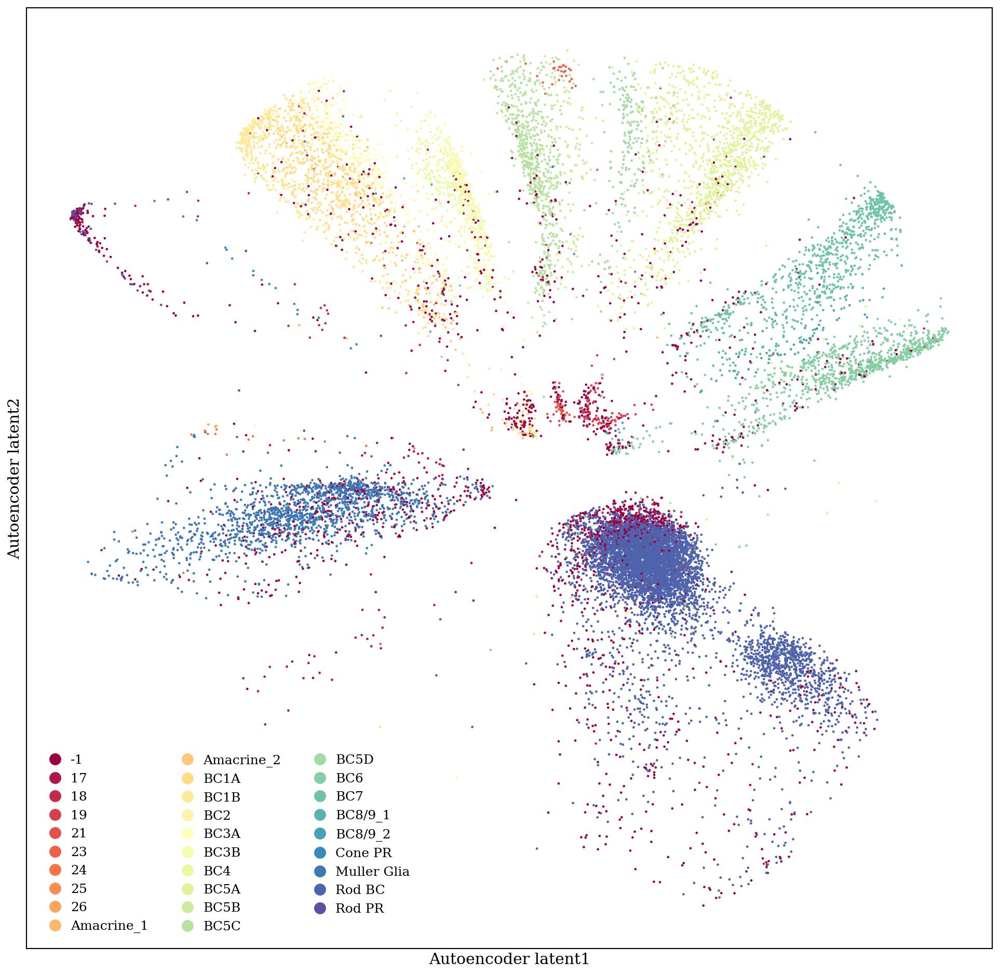

In [72]:
for epoch in range(10):
    train_indices = np.random.choice(range(17200), size=17200, replace=False)
    for ii in range(int(17200/batch_size)):
        data = train_pca_data.take(train_indices[batch_size*ii: batch_size*(ii+1)])
        labels = train_metadata.take(train_indices[batch_size*ii: batch_size*(ii+1)])
        model_input = torch.tensor(data.values).float()

        out = model(model_input)

        # Calculate the loss
        image_targets = model_input
        #print("image_targets.shape", image_targets.shape)
        loss = loss_fn(out, image_targets)

        # Find the gradients of our loss via backpropogation
        loss.backward()

        # Adjust accordingly with the optimizer
        optimizer.step()
        optimizer.zero_grad()
    data = train_pca_data.take(train_indices[:])
    labels = train_metadata.take(train_indices[:])
    model_input = torch.tensor(data.values).float()

    fig, axes = plt.subplots(figsize=(16,16), dpi=150)
    e = model.encode(model_input)
    e = e.detach().numpy()
    labels=metadata.take(train_indices[:])
    #axes.scatter(e[:,0], e[:,1], c=labels)
    scprep.plot.scatter2d(e, c=labels['CELLTYPE'], ax=axes, cmap="Spectral",
                          ticks=False,label_prefix="Autoencoder latent")
    fig.savefig("3_2_retinal_latent_epoch_{0}.png".format(epoch))


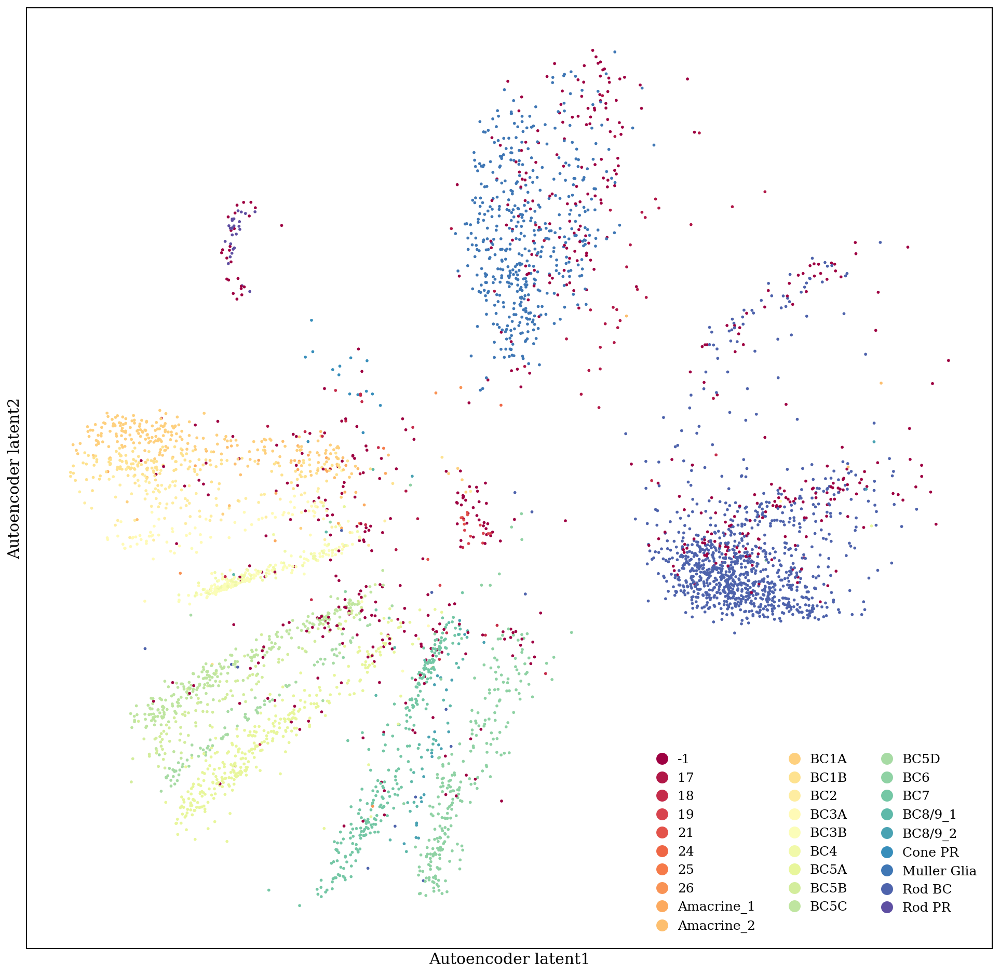

In [70]:
data = test_pca_data
labels = test_metadata
model_input = torch.tensor(data.values).float()
fig, axes = plt.subplots(figsize=(16,16), dpi=150)
e = model.encode(model_input)
e = e.detach().numpy()
#axes.scatter(e[:,0], e[:,1], c=labels)
scprep.plot.scatter2d(e, c=labels['CELLTYPE'], ax=axes, cmap="Spectral",
                  ticks=False,label_prefix="Autoencoder latent")
fig.savefig("3_2_retinal_latent_epoch_{0}.png".format(epoch))
